<a href="https://colab.research.google.com/github/FivaKit/practice/blob/main/updated_hw_16_1_semantic_segmentation_not_filled.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<center><image src="https://drive.google.com/uc?id=1n3G4TdK_u6PQHcLrxB_A0HijNdigXmUH">

<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Домашнее задание. Сегментация изображений</b></h3>


В этом задании вам предстоит решить задачу сегментации медицинских снимков. Домашнее задание можно разделить на следующие части:

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]
* Мир других лоссов! [2]
  * Dice Loss [1]
  * Focal Loss [1]
  * BONUS: лосс из статьи [5]
* Новая модель! [2]
  * UNet [2]


**Максимальный балл:** 10 баллов.

Также для студентов желающих еще более углубиться в задачу предлагается решить бонусное задание, которое даст дополнительные 5 баллов. BONUS задание необязательное.


# Загрузка данных

1. Для начала мы скачаем датасет: [ADDI project](https://www.fc.up.pt/addi/ph2%20database.html).

<table><tr><td>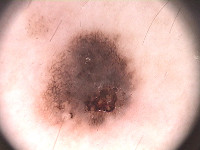</td><td>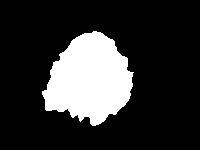</td></tr></table>

2. Разархивируем .rar файл.
3. Обратите внимание, что папка  `PH2 Dataset images` должна лежать там же где и ipynb notebook.

Это фотографии двух типов **поражений кожи:** меланома и родинки.
В данном задании мы не будем заниматься их классификацией, а будем **сегментировать** их.

In [ ]:
!gdown 1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql

Downloading...
From (original): https://drive.google.com/uc?id=1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql
From (redirected): https://drive.google.com/uc?id=1T_RPkPP0jeWwK8L1UrmBw8V30eD7v6Ql&confirm=t&uuid=b72d3515-d7ed-42c0-84f0-f2404f5ab647
To: /content/PH2Dataset.rar
100% 162M/162M [00:04<00:00, 37.3MB/s]


In [ ]:
get_ipython().system_raw("unrar x PH2Dataset.rar")

Стуктура датасета у нас следующая:

    IMD_002/
        IMD002_Dermoscopic_Image/
            IMD002.bmp
        IMD002_lesion/
            IMD002_lesion.bmp
        IMD002_roi/
            ...
    IMD_003/
        ...
        ...

 Здесь `X.bmp` — изображение, которое нужно сегментировать, `X_lesion.bmp` — результат сегментации.

Для загрузки датасета можно использовать skimage: [`skimage.io.imread()`](https://scikit-image.org/docs/dev/api/skimage.io.html)

In [ ]:
images = []
lesions = []
from skimage.io import imread
import os
root = 'PH2Dataset'

for root, dirs, files in os.walk(os.path.join(root, 'PH2 Dataset images')):
    if root.endswith('_Dermoscopic_Image'):
        images.append(imread(os.path.join(root, files[0])))
    if root.endswith('_lesion'):
        lesions.append(imread(os.path.join(root, files[0])))

Изображения имеют разные размеры. Давайте изменим их размер на $256\times256 $ пикселей. Для изменения размера изображений можно использовать [`skimage.transform.resize()`](https://scikit-image.org/docs/dev/api/skimage.transform.html#skimage.transform.resize).
Эта функция также автоматически нормализует изображения в диапазоне $[0,1]$.


In [ ]:
from skimage.transform import resize
size = (256, 256)
X = [resize(x, size, mode='constant', anti_aliasing=True,) for x in images]
Y = [resize(y, size, mode='constant', anti_aliasing=False) > 0.5 for y in lesions]

In [ ]:
import numpy as np
X = np.array(X, np.float32)
Y = np.array(Y, np.float32)
print(f'Loaded {len(X)} images')

Loaded 200 images


Чтобы убедиться, что все корректно, мы нарисуем несколько изображений

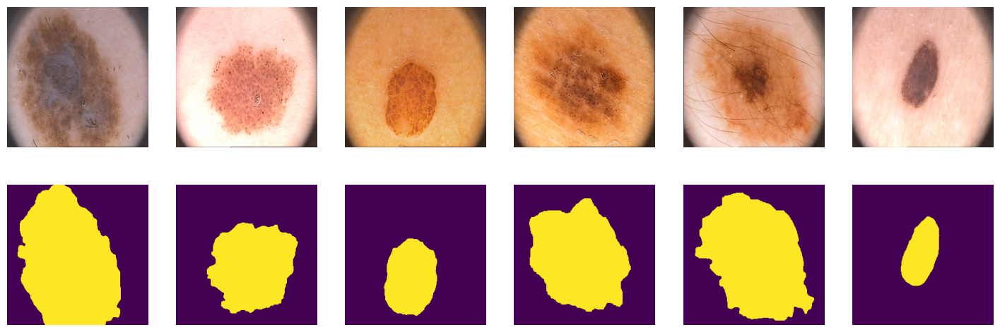

In [ ]:
import matplotlib.pyplot as plt
from IPython.display import clear_output

plt.figure(figsize=(18, 6))
for i in range(6):
    plt.subplot(2, 6, i+1)
    plt.axis("off")
    plt.imshow(X[i])

    plt.subplot(2, 6, i+7)
    plt.axis("off")
    plt.imshow(Y[i])
plt.show();

Разделим наши 200 картинок на 100/50/50
 для обучения, валидации и теста соответственно

In [ ]:
ix = np.random.choice(len(X), len(X), False)
tr, val, ts = np.split(ix, [100, 150])

In [ ]:
print(len(tr), len(val), len(ts))

100 50 50


## PyTorch DataLoader

In [ ]:
from torch.utils.data import DataLoader
batch_size = 25
train_dataloader = DataLoader(list(zip(np.rollaxis(X[tr], 3, 1), Y[tr, np.newaxis])),
                     batch_size=batch_size, shuffle=True)
valid_dataloader = DataLoader(list(zip(np.rollaxis(X[val], 3, 1), Y[val, np.newaxis])),
                      batch_size=batch_size, shuffle=True)
test_dataloader = DataLoader(list(zip(np.rollaxis(X[ts], 3, 1), Y[ts, np.newaxis])),
                     batch_size=batch_size, shuffle=True)

In [ ]:
import torch
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(device)

cuda


# Метрика

## IoU (intersection over union)

В данном разделе предлагается использовать следующую метрику для оценки качества:

$I o U=\frac{\text {target } \cap \text { prediction }}{\text {target } \cup{prediction }}$

Пересечение (A ∩ B) состоит из пикселей, найденных как в маске предсказания, так и в основной маске истины, тогда как объединение (A ∪ B) просто состоит из всех пикселей, найденных либо в маске предсказания, либо в целевой маске.


Что будет являться пересением и объединением в задаче сегментации?

Давайте разберем следующий пример:





<p style="align: center;"><img align=center src="https://drive.google.com/uc?export=view&id=1rBYFgli48AUUN9idiyq8j3J5DboB93yN" width=1000 height=800/></p>

In [ ]:
!pip install torchmetrics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.2/983.2 kB 26.3 MB/s eta 0:00:00


In [ ]:
from torchmetrics import JaccardIndex

iou_score = JaccardIndex(threshold=0.5, task="binary", average='none').to(device)

# Построй свой первый бейзлайн!

Итак, загрузка файлов, код датасета и даталоадера написана за вас. Метрика IoU написана за вас! Вам остается написать лосс, модель и функции обучения и теста модели.

* Построй свой первый бейзлайн! [6]
  * BCE Loss [2]
  * SegNet [2]
  * Train [1]
  * Test [1]

## BCE Loss [2 балла]

Популярным лоссом для бинарной сегментации является *бинарная кросс-энтропия*, которая задается следующим образом:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

где $y$ это  таргет желаемого результата и $\hat y$ является выходом модели. $\sigma$ - это [*логистическая* функция](https://en.wikipedia.org/wiki/Sigmoid_function), который преобразует действительное число $\mathbb R$ в вероятность $[0,1]$.

Однако эта потеря страдает от проблем численной нестабильности. Самое главное, что $\lim_{x\rightarrow0}\log(x)=\infty$ приводит к неустойчивости в процессе оптимизации. Рекомендуется посмотреть следующее [упрощение](https://www.tensorflow.org/api_docs/python/tf/nn/sigmoid_cross_entropy_with_logits). Эта функция эквивалентна первой и не так подвержена численной неустойчивости:

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

### Вывод численно стабильной формулы BCE лосса [1 балл]



Выведите из формулы [1] формулу [2]:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right] \space [1]$$

$$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right) \space [2]$$

Не забываем, что здесь $\hat y_i$ - это логиты сети, не вероятности и не лейблы.

**Ответ:**

### Реализуйте в коде оба варианта лосса [1 балл]

Реализуйте следующие функции:

*   `bce_true()` - честная прямая реализация лосса с формулой $$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$
*   `bce_loss()` - реализация формулы, которую мы вывели $$\mathcal L_{BCE} = \hat y - y\hat y + \log\left(1+\exp(-\hat y)\right).$$

И сравните результаты функций с реализацией Pytorch:
*   `bce_torch()`
*   `bce_torch_with_logits()`

In [ ]:
import torch.nn.functional as F
import torch.nn as nn

In [ ]:
bce_torch = nn.BCELoss(reduction='sum') # (sigmoid(y_pred), y_real)
bce_torch_with_logits = nn.BCEWithLogitsLoss(reduction='sum')

In [ ]:
aa = np.array([1,2,3])
bb = np.array([1,2,3])
ss = torch.tensor(aa)
ss, torch.sigmoid(ss)


(tensor([1, 2, 3]), tensor([0.7311, 0.8808, 0.9526]))

In [ ]:
def bce_loss(y_pred, y_real):
  res = y_pred - y_pred*y_real + torch.log(1+torch.exp(-y_pred))
  return res.sum()

def bce_true(y_pred, y_real):
  res = (-1)*(y_real*(torch.log(torch.sigmoid(y_pred))) + (1-y_real)*(torch.log(1-(torch.sigmoid(y_pred)))))
  return res.sum()

Проверим корректность работы на простом примере

In [ ]:
y_pred = torch.randn(3, 2, requires_grad=False)
y_true = torch.rand(3, 2, requires_grad=False)

In [ ]:
y_true

tensor([[0.9511, 0.7260],
        [0.0258, 0.4659],
        [0.9755, 0.6486]])

In [ ]:
print(f'BCE loss from scratch bce_loss = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch = {bce_torch(torch.sigmoid(y_pred), y_true)}')
print(f'BCE loss from torch with logits bce_torch = {bce_torch_with_logits(y_pred, y_true)}')


BCE loss from scratch bce_loss = 5.067849636077881
BCE loss честно посчитанный = 5.067850112915039
BCE loss from torch bce_torch = 5.067850112915039
BCE loss from torch with logits bce_torch = 5.067849636077881


Инструкции `assert` в Python — это булевы выражения, которые проверяют, является ли условие истинным (`True`). Внизу в коде мы проверяем функция `bce_loss()` выдает тот же результат, что и функция из Pytorch или нет. Если равенства не будет, что будет означать, что результаты функций не совпадают, а значит вы неправильно реализовали фукнцию `bce_loss()`, `assert` возвратит ошибку.

Функция `numpy.isclose()` используется для сравнения двух чисел с учётом допустимой погрешности. Она особенно полезна при работе с числами с плавающей точкой, где точное сравнение может быть проблематичным из-за ограничений представления таких чисел в компьютере.

Как она работает?

`numpy.isclose(a, b, rtol=1e-05, atol=1e-08) `принимает два числа (`a` и `b`) и сравнивает их, учитывая относительную и абсолютную погрешность. Если разница между двумя числами меньше заданного порога, функция возвращает `True`, иначе — `False`.

Параметры:

    rtol: Относительная погрешность (по умолчанию 1e-05). Используется для определения разницы относительно большего значения.
    atol: Абсолютная погрешность (по умолчанию 1e-08). Определяет минимальную разницу, которую следует учитывать.

Мы будем использовать `assert` и `numpy.isclose()` для проверки корректности нашего кода.

In [ ]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true))

Давайте теперь посчитаем на простом примере, но с теми же размерностями, что и в датасете

In [ ]:
y_pred

tensor([[ 0.2806, -0.0405],
        [ 0.1564,  1.0731],
        [-0.8401, -1.0290]])

In [ ]:
y_pred = torch.randn((2, 1, 3, 3), requires_grad=False)
y_true = torch.randint(0, 2, (2, 1, 3, 3))

print(f'BCE loss from scratch bce_loss = {bce_loss(y_pred, y_true)}')
print(f'BCE loss честно посчитанный = {bce_true(y_pred, y_true)}')
print(f'BCE loss from torch bce_torch = {bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float))}')
print(f'BCE loss from torch with logits bce_torch = {bce_torch_with_logits(y_pred, y_true.to(torch.float))}')

BCE loss from scratch bce_loss = 13.376075744628906
BCE loss честно посчитанный = 13.376075744628906
BCE loss from torch bce_torch = 13.376075744628906
BCE loss from torch with logits bce_torch = 13.376075744628906


In [ ]:
assert np.isclose(bce_loss(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_loss(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch(torch.sigmoid(y_pred), y_true.to(torch.float)))
assert np.isclose(bce_true(y_pred, y_true), bce_torch_with_logits(y_pred, y_true.to(torch.float)))

Давайте посчитаем на реальных логитах и сегментационной маске:

In [ ]:
!gdown --folder 1EX0RW1TRQVkLmR1h6miCQqyhYPFyg28M

Retrieving folder contents
Processing file 1--WxvBdpMn_NOmYPf3a4au8MHzfx5baC labels.pt
Processing file 1-0A7_CS_vKiSCkgIDJ4joThCEcFedA3I logits.pt
Retrieving folder contents completed
Building directory structure
Building directory structure completed
Downloading...
From: https://drive.google.com/uc?id=1--WxvBdpMn_NOmYPf3a4au8MHzfx5baC
To: /content/for_asserts/labels.pt
100% 1.18k/1.18k [00:00<00:00, 5.29MB/s]
Downloading...
From: https://drive.google.com/uc?id=1-0A7_CS_vKiSCkgIDJ4joThCEcFedA3I
To: /content/for_asserts/logits.pt
100% 1.18k/1.18k [00:00<00:00, 5.30MB/s]
Download completed


In [ ]:
path_to_dummy_samples = '/content/for_asserts'
dummpy_sample = {'logits': torch.load(f'{path_to_dummy_samples}/logits.pt'),
                 'labels': torch.load(f'{path_to_dummy_samples}/labels.pt')}
dummpy_sample['labels'] = dummpy_sample['labels'].to(device)
dummpy_sample['logits'] = dummpy_sample['logits'].to(device)

In [ ]:
dummpy_sample['labels']

tensor([[[[0., 0., 0., 0.],
          [0., 1., 1., 0.],
          [0., 1., 0., 0.],
          [0., 0., 0., 0.]]]], device='cuda:0')

In [ ]:
dummpy_sample['logits']

tensor([[[[-1.9818, -3.0264, -3.4634, -3.3669],
          [-3.3132, -3.2690,  0.0526, -3.0650],
          [-3.1722,  0.2558,  0.2902, -3.2031],
          [-3.0457, -3.0761, -3.1206, -3.1873]]]], device='cuda:0')

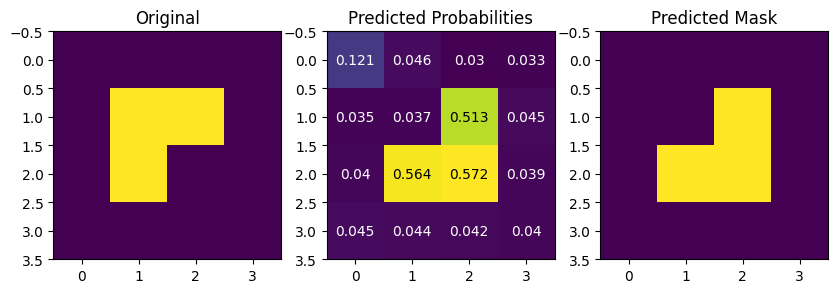

In [ ]:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize= (10,3*10))

ax1.imshow(dummpy_sample['labels'].squeeze(1)[0].cpu())
ax1.set_title("Original")

ax2.imshow(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu())
for (j,i),label in np.ndenumerate(dummpy_sample['logits'].sigmoid().squeeze(1)[0].cpu()):
    if label < 0.5:
        color = 'white'
    else:
        color = 'black'
    ax2.text(i,j,round(label,3), color=color, ha='center',va='center')

ax2.set_title("Predicted Probabilities")

ax3.imshow((dummpy_sample['logits'].sigmoid() > 0.5).squeeze(1)[0].cpu())
ax3.set_title("Predicted Mask")
plt.show()

Проверяем на данном примере:

In [ ]:
bce_loss_score = bce_loss(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_true_score = bce_true(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu())
bce_torch_score = bce_torch(torch.sigmoid(dummpy_sample['logits'].cpu()), dummpy_sample['labels'].cpu().float())
bce_torch_with_logits_score = bce_torch_with_logits(dummpy_sample['logits'].cpu(), dummpy_sample['labels'].cpu().float())
assert np.isclose(bce_loss_score, bce_torch_score)
assert np.isclose(bce_loss_score, bce_torch_with_logits_score)
assert np.isclose(bce_true_score, bce_torch_score)
assert np.isclose(bce_true_score, bce_torch_with_logits_score)

## SegNet [2 балла]

Ваше задание здесь состоит в том, чтобы реализовать SegNet архитектуру.

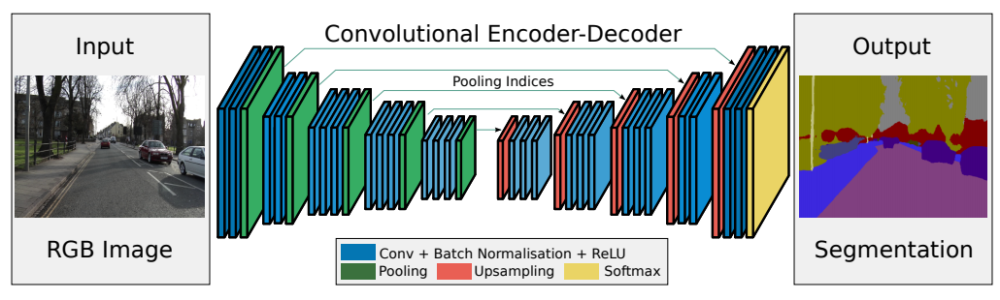

* Badrinarayanan, V., Kendall, A., & Cipolla, R. (2015). [SegNet: A deep convolutional
encoder-decoder architecture for image segmentation](https://arxiv.org/pdf/1511.00561.pdf)

Внимательно посмотрите из чего состоит модель и для чего выбраны те или иные блоки.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from time import time

from matplotlib import rcParams
rcParams['figure.figsize'] = (15,4)

In [ ]:
example = next(iter(train_dataloader))
example[0].shape

torch.Size([25, 3, 256, 256])

Хорошие ресурсы по SegNet архитектуре:
1. https://medium.com/@nikdenof/segnet-from-scratch-using-pytorch-3fe9b4527239


In [ ]:
class SegNet(nn.Module):
    def __init__(self, in_channels=3, out_channels=1):
        super().__init__()
        self.enc_conv0 = nn.Conv2d(3, 8, kernel_size=3, padding=1)
        self.enc_bn0 = nn.BatchNorm2d(num_features=8)
        self.enc_conv1 = nn.Conv2d(8, 16, kernel_size=3, padding=1)
        self.enc_bn1 = nn.BatchNorm2d(num_features=16)
        self.pool1 = nn.MaxPool2d((2,2)) #256->128
        #--
        self.enc_conv2 = nn.Conv2d(16, 32, kernel_size=3, padding=1)
        self.enc_bn2 = nn.BatchNorm2d(num_features=32)
        self.enc_conv3 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.enc_bn3 = nn.BatchNorm2d(num_features=64)
        self.pool3 = nn.MaxPool2d((2,2)) #128->64
        #--
        self.enc_conv4 = nn.Conv2d(64, 64, kernel_size=3, padding=1)
        self.enc_bn4 = nn.BatchNorm2d(num_features=64)
        self.enc_conv5 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.enc_bn5 = nn.BatchNorm2d(num_features=128)
        self.pool5 = nn.MaxPool2d((2,2)) #64 -> 32
        #-- bottleneck
        self.bottleneck = nn.Conv2d(128, 128, kernel_size=3, padding=1)
        # decoder
        self.upsample0 = nn.Upsample(scale_factor=2) #32->64
        self.dec_bn0 = nn.BatchNorm2d(256)
        self.dec_conv0 = nn.Conv2d(256, 64, kernel_size=3, padding=1)
        self.dec_bn1 = nn.BatchNorm2d(128)
        self.dec_conv1 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        #--
        self.upsample2 = nn.Upsample(scale_factor=2) #64->128
        self.dec_bn2 = nn.BatchNorm2d(128)
        self.dec_conv2 = nn.Conv2d(128, 32, kernel_size=3, padding=1)
        self.dec_bn3 = nn.BatchNorm2d(64)
        self.dec_conv3 = nn.Conv2d(64, 16, kernel_size=3, padding=1)
        #--
        self.upsample4 = nn.Upsample(scale_factor=2) #128->256
        self.dec_bn4 = nn.BatchNorm2d(32)
        self.dec_conv4 = nn.Conv2d(32, 8, kernel_size=3, padding=1)
        self.dec_bn5 = nn.BatchNorm2d(16)
        self.dec_conv5 = nn.Conv2d(16, 1, kernel_size=3, padding=1)


        # VGG-16 architecture
        # TODO

        # bottleneck
        # TODO

        # decoder (upsampling)
        # TODO

    def forward(self, x):
        e0 = self.enc_bn0(F.relu(self.enc_conv0(x)))
        e1 = self.enc_bn1(self.pool1(F.relu(self.enc_conv1(e0))))
        e2 = self.enc_bn2(F.relu(self.enc_conv2(e1)))
        e3 = self.enc_bn3(self.pool3(F.relu(self.enc_conv3(e2))))
        e4 = self.enc_bn4(F.relu(self.enc_conv4(e3)))
        e5 = self.enc_bn5(self.pool5(F.relu(self.enc_conv5(e4))))

        b = self.bottleneck(e5)

        d0 = self.dec_conv0(self.dec_bn0(F.relu(self.upsample0(torch.cat([b, e5], 1)))))
        d1 = self.dec_conv1(self.dec_bn1(F.relu(torch.cat([d0, e4], 1))))
        d2 = self.dec_conv2(self.dec_bn2(F.relu(self.upsample2(torch.cat([d1, e3], 1)))))
        d3 = self.dec_conv3(self.dec_bn3(F.relu(torch.cat([d2, e2], 1))))
        d4 = self.dec_conv4(self.dec_bn4(F.relu(self.upsample4(torch.cat([d3, e1], 1)))))
        d5 = self.dec_conv5(self.dec_bn5(F.relu(torch.cat([d4, e0], 1))))


        return d5

In [ ]:
segnet_model = SegNet().to(device)

## Тренировка [1 балл]

Напишите функцию для обучения модели.

In [ ]:
from tqdm.notebook import tqdm

In [ ]:
example, ex = next(iter(train_dataloader))
with torch.no_grad():
  n = segnet_model(example.to(device))

# loss(n, ex.to(device))


In [ ]:
ex = ex.to(device)

In [ ]:
nnn = torch.log(torch.sigmoid(n))*ex  + (1-ex)*(torch.log(1-(torch.sigmoid(n))))
nnn.sum(), bce_loss(n, ex)

(tensor(-inf, device='cuda:0'), tensor(1255104.2500, device='cuda:0'))

In [ ]:
len(train_dataloader)

4

In [ ]:
import matplotlib.patches as mpatches

In [ ]:
iou_score = JaccardIndex(threshold=0.5, task="binary", average='none').to(device)

In [ ]:
def train(model, opt, loss_fn, epochs, data_train, data_val, plot):
  for epoch in tqdm(range(epochs)):
    print('epoch:', epoch)
    avg_loss = 0
    avg_iou = 0
    avg_val_iou = 0
    avg_val_loss = 0
    for i, (x_batch, y_batch) in tqdm(enumerate(data_train)):
      model.train()
      x_batch, y_batch = x_batch.to(device), y_batch.to(device)
      logits = model(x_batch)
      loss = loss_fn(logits, y_batch)
      loss.backward()
      opt.step()
      opt.zero_grad()
      iou = iou_score(torch.sigmoid(logits), y_batch).item()

      avg_loss += loss/len(data_train)
      avg_iou += iou/len(data_train)


    model.eval()
    with torch.no_grad():
      for i, (X_batch, Y_batch) in tqdm(enumerate(data_train)):
        X_val, Y_val = next(iter(data_val))
        X_val, Y_val = X_val.to(device), Y_val.to(device)
        Y_pred = model(X_val)
        loss_val = loss_fn(Y_pred, Y_val)
        iou_val = iou_score(torch.sigmoid(Y_pred), Y_val).item()

        avg_val_iou += iou_val/len(data_val)
        avg_val_loss += loss_val/len(data_val)
    print('   train_loss:', avg_loss)
    print('   train_iou:', avg_iou)
    print('   val_loss:', avg_val_loss)
    print('   val_iou:', avg_val_iou)
    if plot and i%3==0:
        # clear_output(wait=True)
        our_labels = {
            0: 'background',
            1: 'Target'
        }

        fig, axes = plt.subplots(1, 3, figsize=(3*4, 3*4))

        orig_img = X_val[0].permute(1,2,0).cpu().detach().numpy()
        orig_mask = Y_val[0].permute(1,2,0).cpu().detach().numpy()

        axes[0].imshow(orig_img);
        axes[0].set_title("Original Image")

        diagram = axes[1].imshow(orig_mask, interpolation='none')
        values = np.unique(orig_mask)
        colors = [ diagram.cmap(diagram.norm(value)) for value in values]
        patches = [ mpatches.Patch(color=colors[i], label=f"{i} - {our_labels[i]}" ) for i in range(len(values)) ]
        axes[1].legend(handles=patches, bbox_to_anchor=(1.00, 1), loc=1, borderaxespad=0. )
        axes[1].set_title("Original Mask")


        probs = torch.sigmoid(Y_pred[0]).permute(1,2,0).cpu().detach().numpy()

        axes[2].imshow(probs>0.5)
        axes[2].set_title(f"{our_labels[1]}, iou = {'%.3f' % avg_val_iou}")

        plt.show()
  return model



  # TODO

Обучите модель **SegNet**. В качестве оптимайзера можно взять Adam.

In [ ]:
loss = bce_loss
opt = torch.optim.Adam(segnet_model.parameters(), lr=1e-3)
model = train(model=segnet_model, opt=opt, loss_fn=dice_loss, epochs=20, data_train=train_dataloader, data_val=valid_dataloader, plot=True)

NameError: name 'dice_loss' is not defined

## Инференс [1 балл]

После обучения модели напишите фукнцию теста, воспользуйтесь лучшим чекпоинтом и протестируйте работу модели на тестовой выборке.

In [ ]:
def test(model, test_data):
  model.eval()
  avg_iou = 0
  with torch.no_grad():
    for X_batch, Y_batch in test_data:
      X_batch, Y_batch = X_batch.to(device), Y_batch.to(device)
      Y_pred = model(X_batch).to(device)
      iou = iou_score(torch.sigmoid(Y_pred), Y_batch)
      avg_iou+=iou

      our_labels = {
            0: 'background',
            1: 'Target'
        }

      fig, axes = plt.subplots(1, 3, figsize=(3*4, 3*4))

      orig_img = X_batch[0].permute(1,2,0).cpu().detach().numpy()
      orig_mask = Y_batch[0].permute(1,2,0).cpu().detach().numpy()

      axes[0].imshow(orig_img);
      axes[0].set_title("Original Image")

      diagram = axes[1].imshow(orig_mask, interpolation='none')
      values = np.unique(orig_mask)
      colors = [ diagram.cmap(diagram.norm(value)) for value in values]
      patches = [ mpatches.Patch(color=colors[i], label=f"{i} - {our_labels[i]}" ) for i in range(len(values)) ]
      axes[1].legend(handles=patches, bbox_to_anchor=(1.00, 1), loc=1, borderaxespad=0. )
      axes[1].set_title("Original Mask")


      probs = torch.sigmoid(Y_pred[0]).permute(1,2,0).cpu().detach().numpy()

      axes[2].imshow(probs>0.5)
      axes[2].set_title(f"{our_labels[1]}, iou = {'%.3f' % iou}")

      plt.show()


    avg_iou = avg_iou/2
    print(f'avg_iou: {avg_iou}')




In [ ]:
example, ex = next(iter(test_dataloader))
model.eval()
with torch.no_grads():
  n = model(ex)

# Мир других лоссов!

## Дополнительные функции потерь [2 балла]

В данном разделе вам потребуется имплементировать две функции потерь: DICE и Focal loss.


### Dice Loss

**1. Dice coefficient:** Учитывая две маски $X$ и $Y$, общая метрика для измерения расстояния между этими двумя масками задается следующим образом:

$$D(X,Y)=\frac{2|X\cap Y|}{|X|+|Y|}$$

В терминах матрицы ошибок она будет считаться следующим образом:

$$D(X,Y) = \frac{2TP}{2TP + FP + FN}$$

Эта функция не является дифференцируемой, но это необходимое свойство для градиентного спуска. В данном случае мы можем приблизить его с помощью:

$$\mathcal L_D(X,Y) = 1- D(X, Y)$$

**Hints** (!):

1. Не забудьте подумать о численной нестабильности, возникающей в математической формуле при ситуации, когда $\frac{0}{0}$, т.е. вам нужно добавить очень маленькое число, например $\epsilon = 1e^{-8}$, в обе части дроби при подсчете $D(X,Y)$:

$$D(X,Y) = \frac{2TP + ϵ}{2TP + FP + FN + ϵ}$$

2. Dice метрика(!), не лосс, считается похожим образом как IoU:

    2.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    2.2. Фиксируем порог, например threshold=0.5, и всему что ниже порога ставим значение 0, всему что выше 1. Получаем предсказанную маску из 0 и 1.

    2.3. Считаем TP, FP, FN

    2.4. Считаем DICE метрику по формуле

Вы можете прописать для себя функцию `dice_score()` и сравнить с результатами работы функции из библиотеки `torchmetrics`.

3. Но с метрикой есть проблема, что она не дифференцируема, и если вы захотите просто взять и прописать `dice_loss` = 1 - `dice_score`, Pytorch поругается на вас и скажет, что это недифференцируемая метрика. Чтобы посчитать dice_loss делаем следующие шаги:

    3.1. На вход вам приходят logits, т.е. значения от $-∞$ до $∞$. Их переводим в вероятности от 0 до 1 при помощи функции Sigmoid.

    3.2. Здесь нам уже не нужно фиксировать порог, мы просто работаем с вероятностями. Значения вероятностей дифференцируемы и через них будут протекать градиенты.

    3.3. Считаем TP, FP, FN также как и в Dice метрике, только вместо маски, подаем вероятности.

    3.4. Считаем DICE метрику по формуле

    3.5. Считаем лосс как Loss = 1 - DICE

Итак, давайте сначала пропишем dice_score.

In [ ]:
def dice_score(logits: torch.Tensor, labels: torch.Tensor, threshold: float = 0.5):
    e = 1e-8

    probs = torch.sigmoid(logits)
    new_mask = (probs>0.5).int()

    tp = new_mask*labels
    fp = new_mask-tp
    fn = labels-tp
    tp = tp.sum()
    fp = fp.sum()
    fn = fn.sum()
    score = (2*tp+e)/(2*tp+fp+fn+e)

    return score

Проверим на корректность функцию dice_score:

In [ ]:
dice_score(logits = dummpy_sample['logits'], labels = dummpy_sample['labels'])

tensor(0.6667, device='cuda:0')

Давайте теперь пропишем лосс и воспользуемся библиотекой `segmentation-models-pytorch`, чтобы убедиться в корректности нашей функции.

In [ ]:
def dice_loss(logits: torch.Tensor, labels: torch.Tensor):
    e = 1e-8
    new_mask = torch.sigmoid(logits)
    tp = new_mask*labels
    fp = new_mask-tp
    fn = labels-tp
    tp = tp.sum()
    fp = fp.sum()
    fn = fn.sum()
    score = (2*tp+e)/(2*tp+fp+fn+e)
    loss = 1 - score
    return loss

Проверка на корректность:

In [ ]:
!pip install segmentation-models-pytorch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 154.8/154.8 kB 6.0 MB/s eta 0:00:00


In [ ]:
from segmentation_models_pytorch.losses import DiceLoss
dice_loss_torch = DiceLoss(mode='binary')
dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'])

tensor(0.5756, device='cuda:0')

In [ ]:
dice_loss(dummpy_sample['logits'], dummpy_sample['labels'])

tensor(0.5756, device='cuda:0')

In [ ]:
assert dice_loss_torch(dummpy_sample['logits'], dummpy_sample['labels'].to(int)) == dice_loss(dummpy_sample['logits'], dummpy_sample['labels'])

### Focal Loss

[**2. Focal loss:**](https://arxiv.org/pdf/1708.02002.pdf)

Окей, мы уже с вами умеем делать BCE loss:

$$\mathcal L_{BCE}(y, \hat y) = -\sum_i \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Проблема с этой потерей заключается в том, что она имеет тенденцию приносить пользу классу **большинства** (фоновому) по отношению к классу **меньшинства** ( переднему). Поэтому обычно применяются весовые коэффициенты к каждому классу:

$$\mathcal L_{wBCE}(y, \hat y) = -\sum_i \alpha_i\left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

Традиционно вес $\alpha_i$ определяется как обратная частота класса этого пикселя $i$, так что наблюдения миноритарного класса весят больше по отношению к классу большинства.


Из оригинальной статьи по [Focal Loss](https://arxiv.org/pdf/1708.02002.pdf):

$$p_t = \sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)$$

$$\mathcal L_{focal}(y, \hat y) = (1 - p_t)^{\gamma} \mathcal L_{BCE}(y_i, \hat y_i).$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - p_t)^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

$$\mathcal L_{focal}(y, \hat y) = -\sum_i (1 - (\sigma(\hat y_i)y_i + (1 - \sigma(\hat y_i)) (1-y_i)))^{\gamma} \left[y_i\log\sigma(\hat y_i) + (1-y_i)\log(1-\sigma(\hat y_i))\right].$$

In [ ]:
def focal_loss(y_pred, y_real, eps = 1e-8, gamma = 2.0):
    pt = torch.sigmoid(y_pred)*y_real + (1-torch.sigmoid(y_pred))*(1-y_real)
    L_focal = ((1-pt)**2)*(y_real*torch.log(torch.sigmoid(y_pred))+(1-y_real)*torch.log(1-torch.sigmoid(y_pred)))
    loss = (-1)*L_focal.sum()

    return loss

Проверка корректности функции:

In [ ]:
from torchvision.ops import sigmoid_focal_loss
sigmoid_focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], alpha=-1, gamma=2, reduction='sum')

tensor(3.6161, device='cuda:0')

In [ ]:
focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], gamma=2.0)

tensor(3.6161, device='cuda:0')

In [ ]:
assert torch.isclose(sigmoid_focal_loss(dummpy_sample['logits'], dummpy_sample['labels'], alpha=-1, gamma=2, reduction='sum'), focal_loss(dummpy_sample['labels'], dummpy_sample['logits'], gamma=2.0))

## [BONUS] Мир сегментационных лоссов [5 баллов]

В данном блоке предлагаем вам написать одну функцию потерь самостоятельно. Для этого необходимо прочитать статью и имплементировать ее, и провести численное сравнение с предыдущими функциями.

* [Physiological Inspired Deep Neural Networks for Emotion Recognition](https://ieeexplore.ieee.org/stamp/stamp.jsp?arnumber=8472816&tag=1)". IEEE Access, 6, 53930-53943.

* [Boundary loss for highly unbalanced segmentation](https://arxiv.org/abs/1812.07032)

* [Tversky loss function for image segmentation using 3D fully convolutional deep networks](https://arxiv.org/abs/1706.05721)

* [Correlation Maximized Structural Similarity Loss for Semantic Segmentation](https://arxiv.org/abs/1910.08711)

* [Topology-Preserving Deep Image Segmentation](https://papers.nips.cc/paper/8803-topology-preserving-deep-image-segmentation)

## Обучите SegNet на новых лоссах

**Задание**: обучите SegNet на новых лоссах и сравните все три лосса:
*   При каком лоссе модель сходится быстрее?
*   При каком лоссе модель выдает наилучшую метрику?

Напишите развернутый ответ на вопросы.



In [ ]:
segnet_model = SegNet().to(device)

  0%|          | 0/40 [00:00<?, ?it/s]

epoch: 0


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.5243, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.4770261123776436
   val_loss: tensor(1.1857, device='cuda:0')
   val_iou: 0.7194985449314117


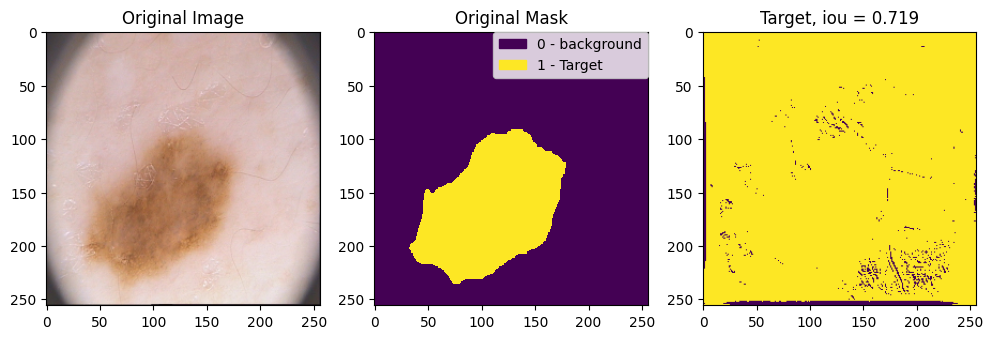

epoch: 1


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.4256, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.5707543417811394
   val_loss: tensor(1.2462, device='cuda:0')
   val_iou: 0.0011940558906644583


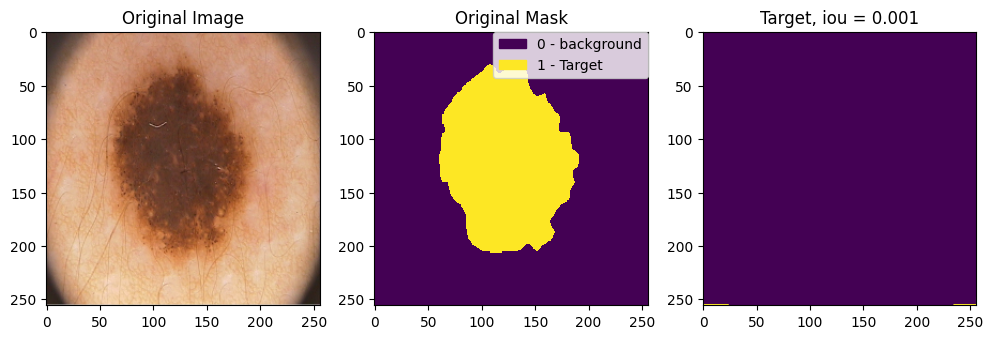

epoch: 2


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.3723, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.6125044077634811
   val_loss: tensor(1.3333, device='cuda:0')
   val_iou: 1.0390050192654599e-05


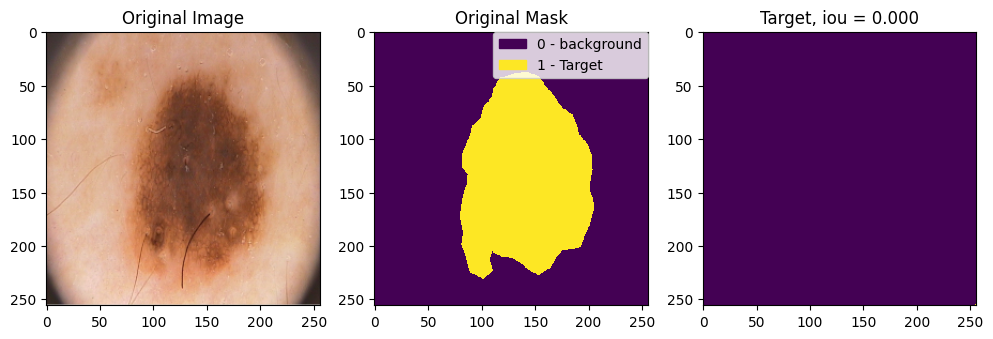

epoch: 3


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.3279, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.6328280866146088
   val_loss: tensor(1.6152, device='cuda:0')
   val_iou: 2.742190076787665e-06


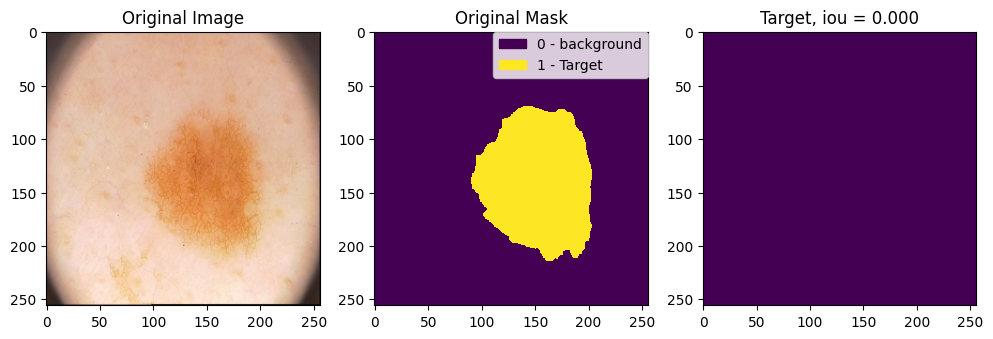

epoch: 4


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.2971, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.6424164026975632
   val_loss: tensor(1.7713, device='cuda:0')
   val_iou: 0.0


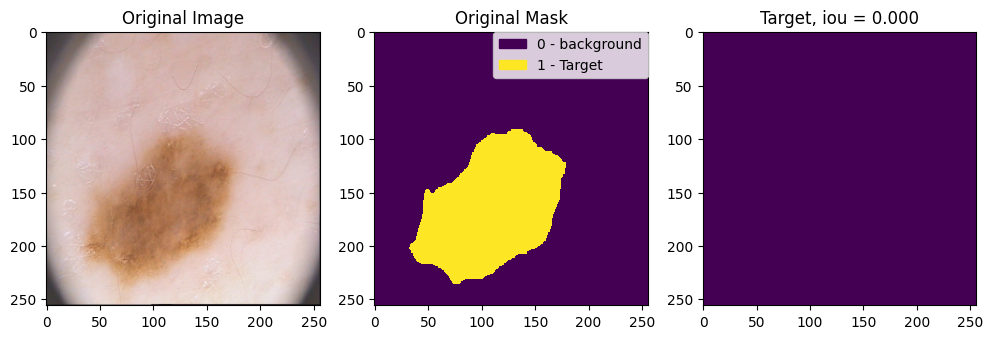

epoch: 5


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.2619, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.6979565173387527
   val_loss: tensor(1.7977, device='cuda:0')
   val_iou: 0.0


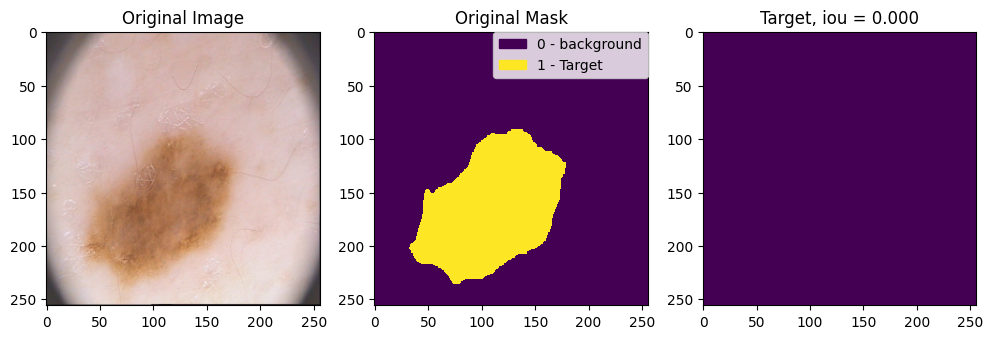

epoch: 6


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.2380, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7102940827608109
   val_loss: tensor(1.7841, device='cuda:0')
   val_iou: 0.03783982736058533


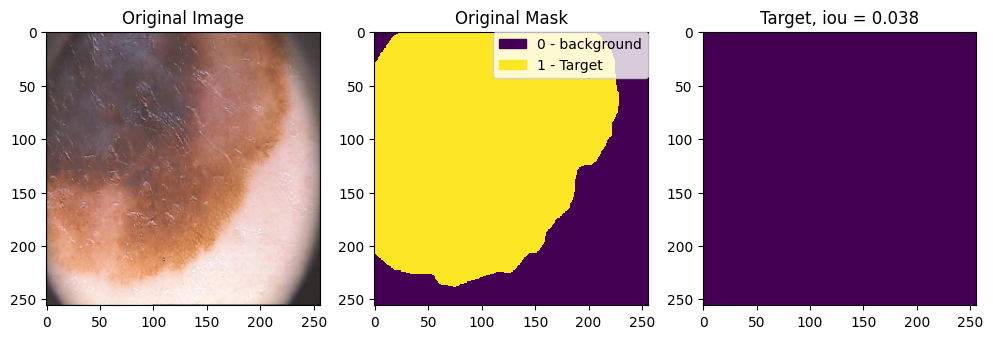

epoch: 7


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.2040, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7687516808509827
   val_loss: tensor(1.7185, device='cuda:0')
   val_iou: 0.0810755928978324


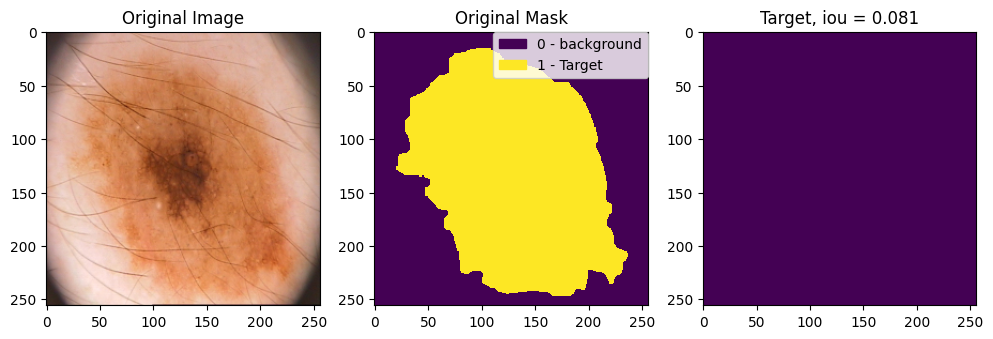

epoch: 8


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1927, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7596684694290161
   val_loss: tensor(1.8440, device='cuda:0')
   val_iou: 0.006390629696397809


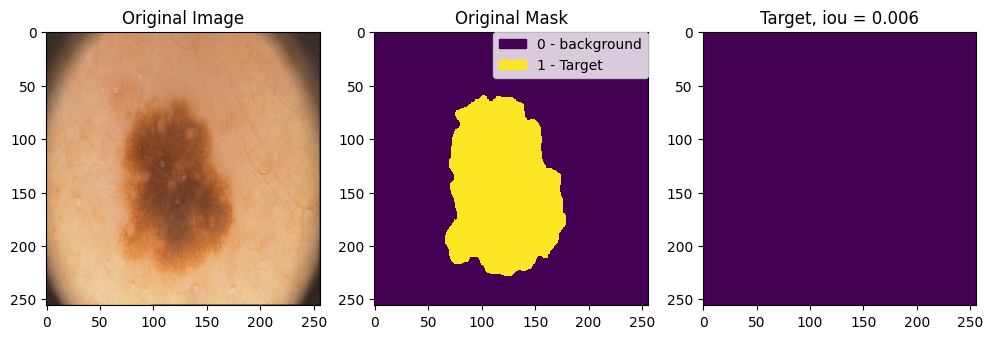

epoch: 9


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1955, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7437453866004944
   val_loss: tensor(0.6587, device='cuda:0')
   val_iou: 1.0526308566331863


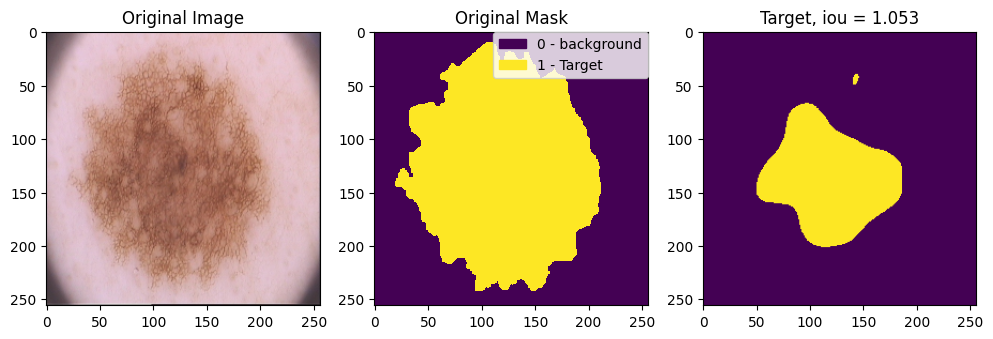

epoch: 10


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1712, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7715964168310165
   val_loss: tensor(0.5104, device='cuda:0')
   val_iou: 1.2511855959892273


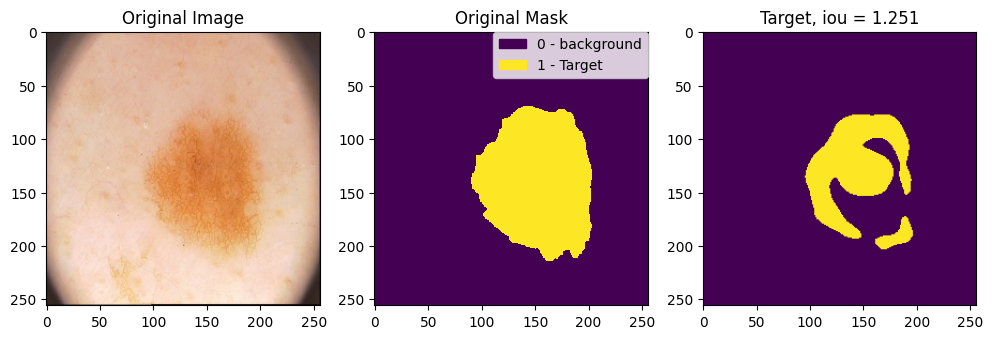

epoch: 11


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1740, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.753826692700386
   val_loss: tensor(0.4782, device='cuda:0')
   val_iou: 1.2926210165023804


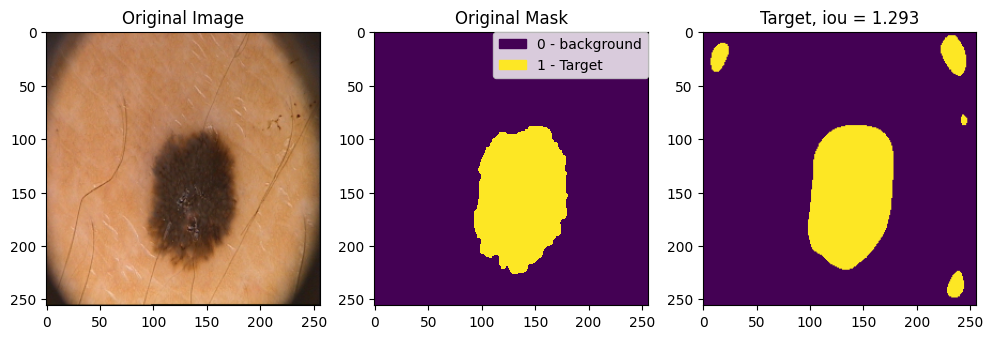

epoch: 12


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1659, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7715049684047699
   val_loss: tensor(0.2998, device='cuda:0')
   val_iou: 1.5603763461112976


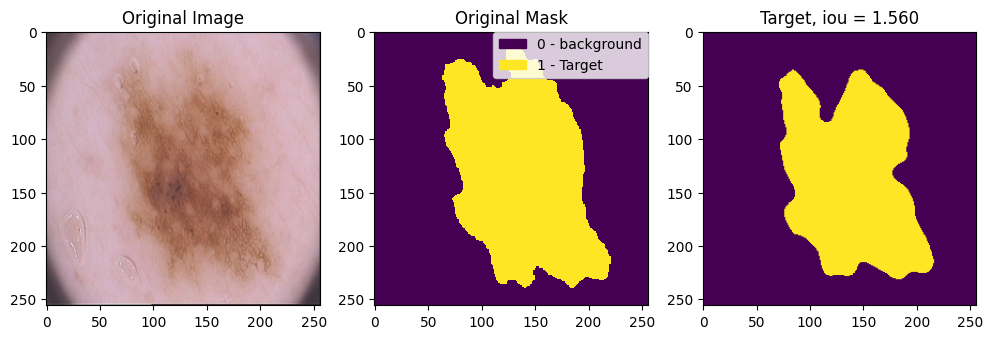

epoch: 13


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1453, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.791077584028244
   val_loss: tensor(0.3553, device='cuda:0')
   val_iou: 1.4511012732982635


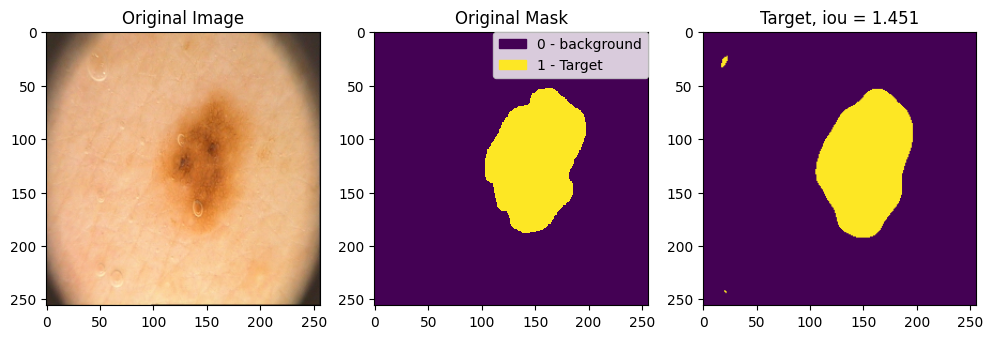

epoch: 14


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1475, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7818797677755356
   val_loss: tensor(0.3645, device='cuda:0')
   val_iou: 1.4438273012638092


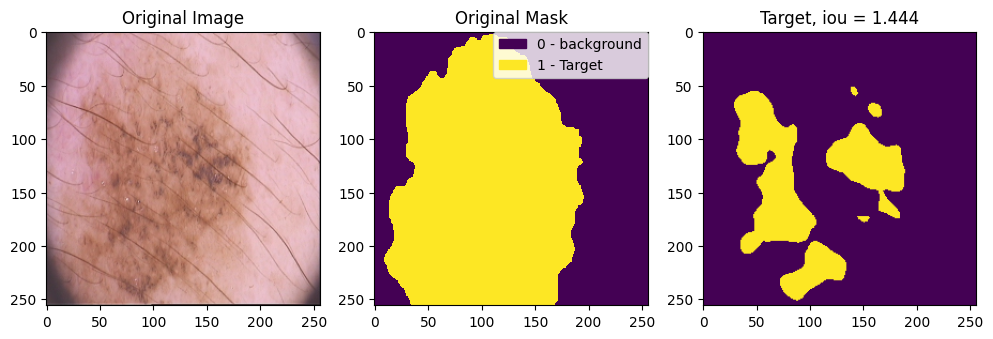

epoch: 15


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1573, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7611258625984192
   val_loss: tensor(0.3115, device='cuda:0')
   val_iou: 1.5060358941555023


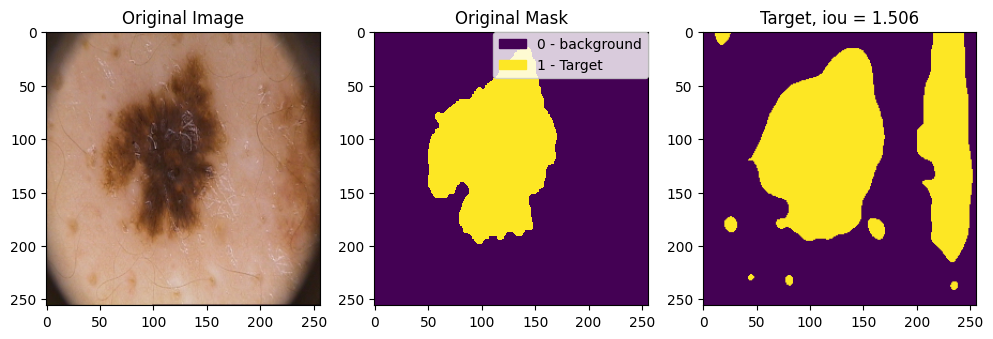

epoch: 16


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1518, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7696647644042969
   val_loss: tensor(0.3384, device='cuda:0')
   val_iou: 1.4708905220031738


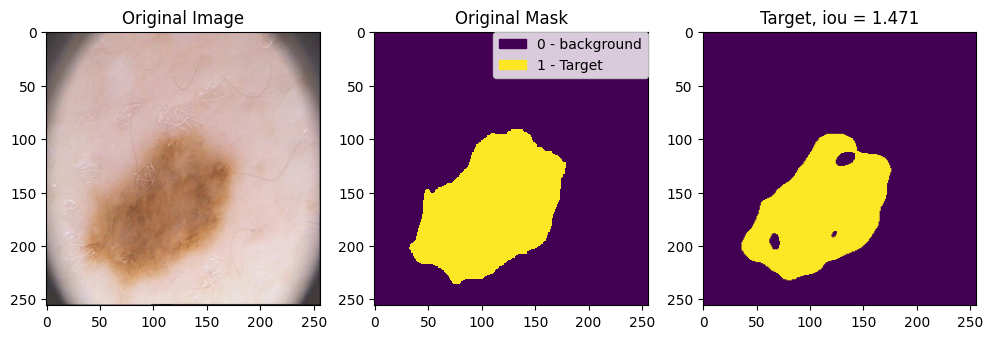

epoch: 17


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1332, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7957725673913956
   val_loss: tensor(0.3075, device='cuda:0')
   val_iou: 1.5120006501674652


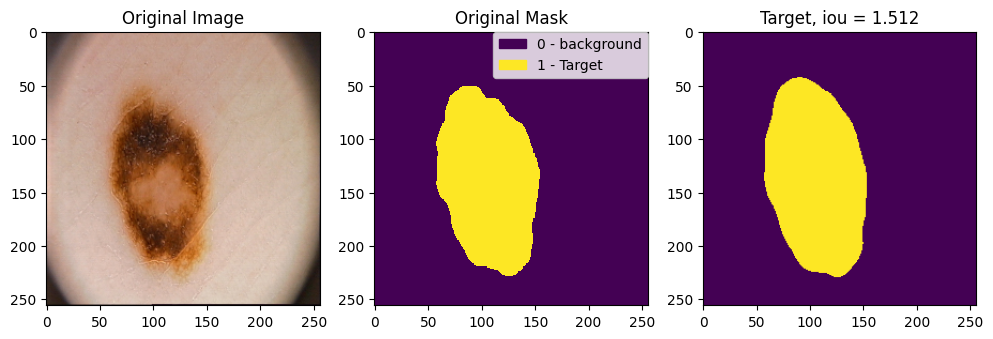

epoch: 18


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1232, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8064742237329483
   val_loss: tensor(0.4206, device='cuda:0')
   val_iou: 1.345874547958374


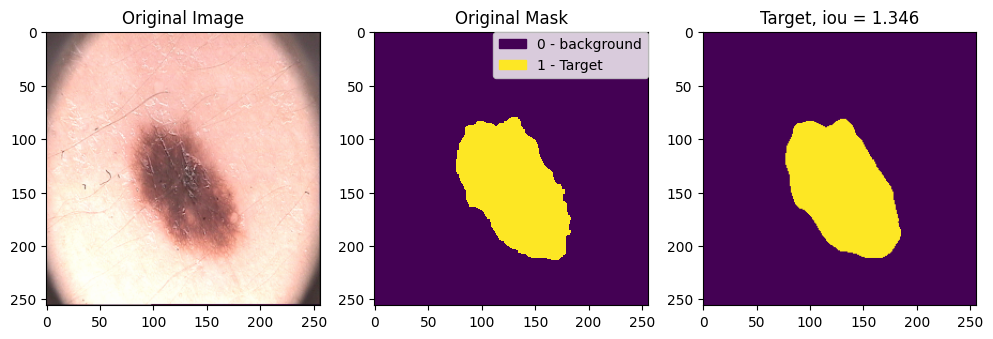

epoch: 19


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1424, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7777705192565918
   val_loss: tensor(0.2814, device='cuda:0')
   val_iou: 1.5425936579704285


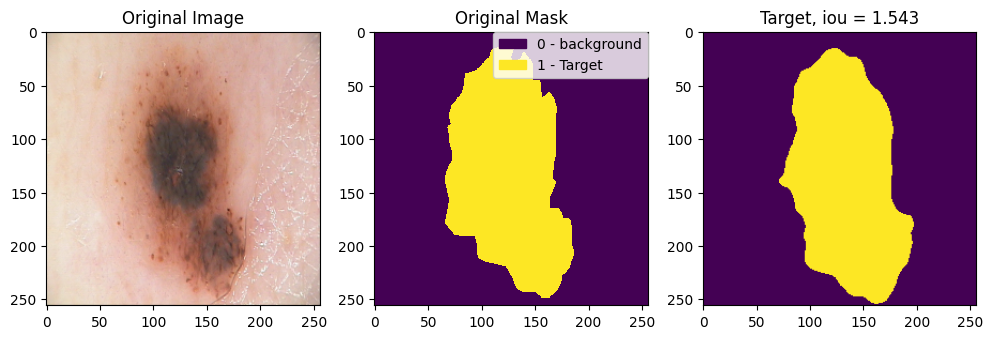

epoch: 20


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1320, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7893272638320923
   val_loss: tensor(0.3768, device='cuda:0')
   val_iou: 1.4001386761665344


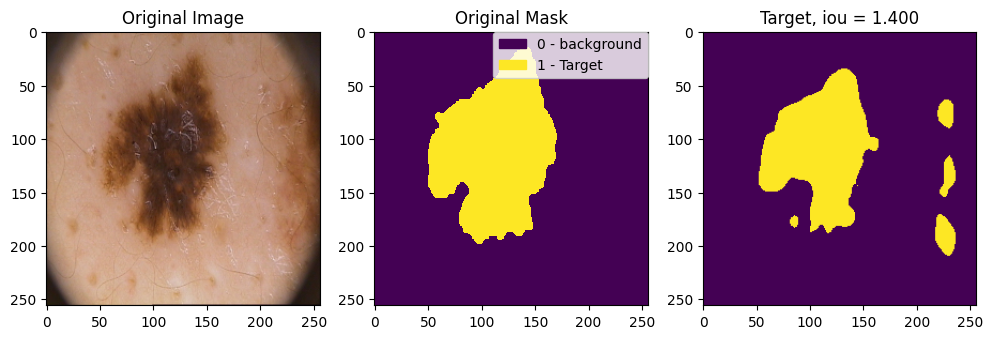

epoch: 21


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1367, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.7829772233963013
   val_loss: tensor(0.2662, device='cuda:0')
   val_iou: 1.5652126669883728


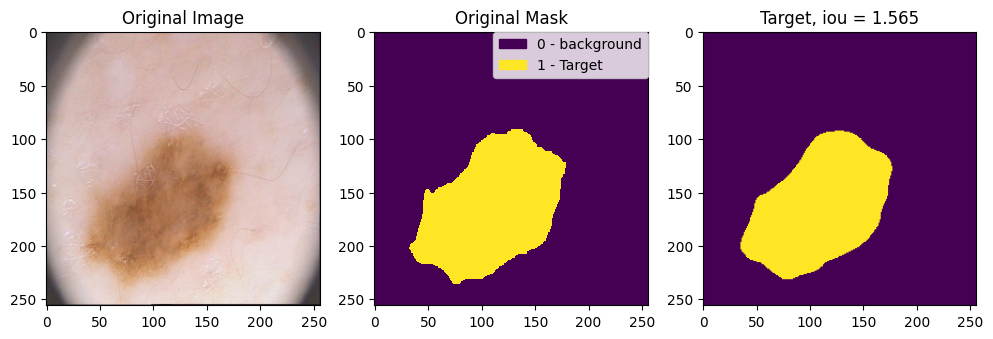

epoch: 22


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1211, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8061237037181854
   val_loss: tensor(0.2432, device='cuda:0')
   val_iou: 1.6013835668563843


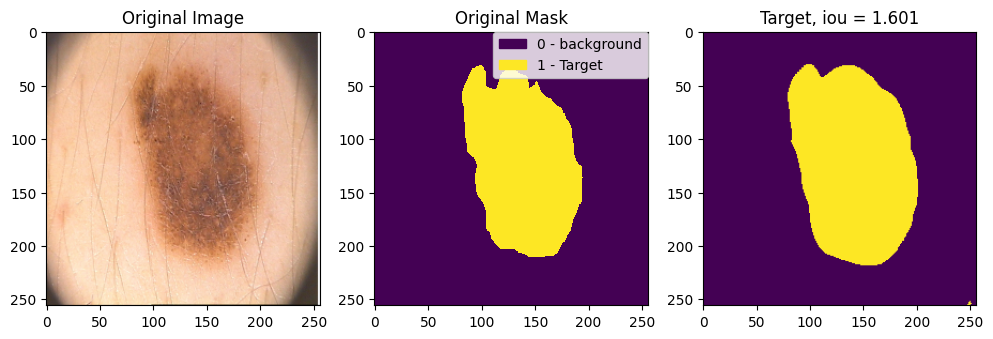

epoch: 23


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1111, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8163873851299286
   val_loss: tensor(0.2640, device='cuda:0')
   val_iou: 1.5612048208713531


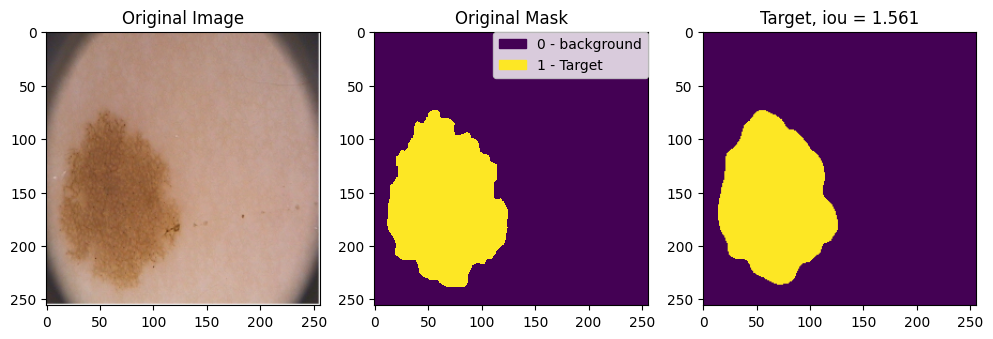

epoch: 24


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1151, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8125189244747162
   val_loss: tensor(0.3611, device='cuda:0')
   val_iou: 1.4055600464344025


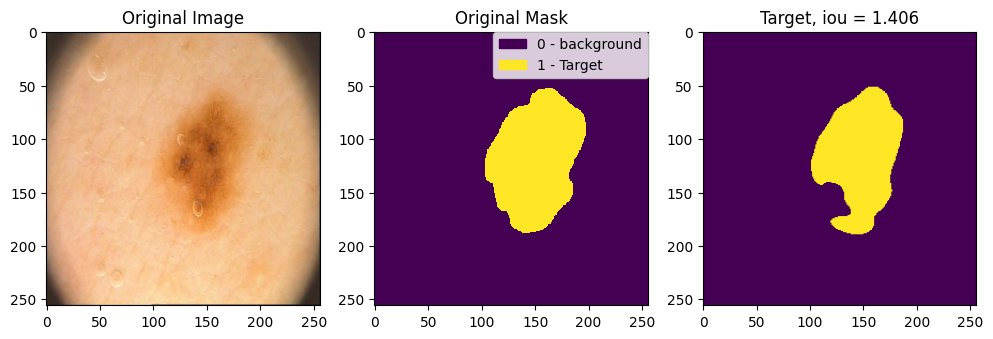

epoch: 25


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.0965, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8409009426832199
   val_loss: tensor(0.2844, device='cuda:0')
   val_iou: 1.5219072699546814


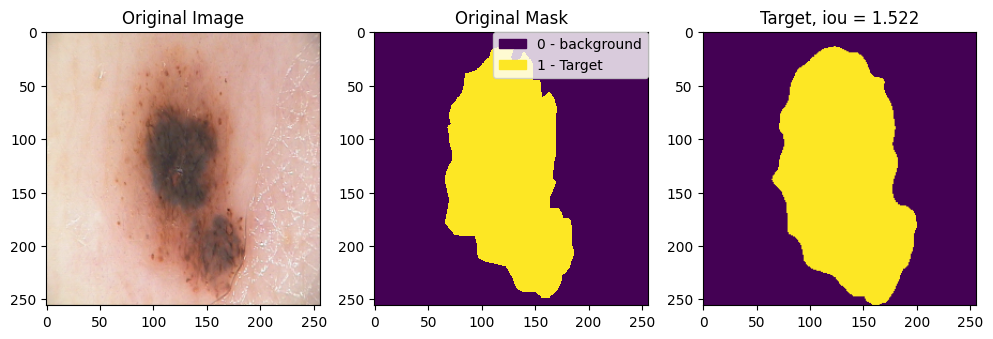

epoch: 26


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1182, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.800849199295044
   val_loss: tensor(0.2216, device='cuda:0')
   val_iou: 1.6248908042907715


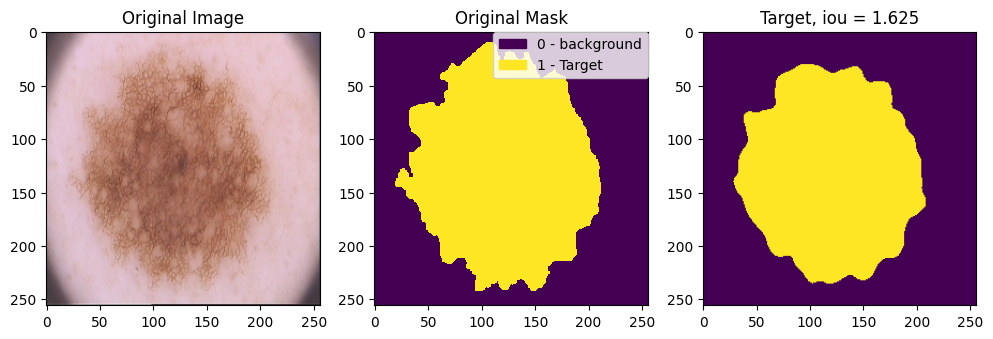

epoch: 27


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1051, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8239382207393646
   val_loss: tensor(0.2431, device='cuda:0')
   val_iou: 1.5847867727279663


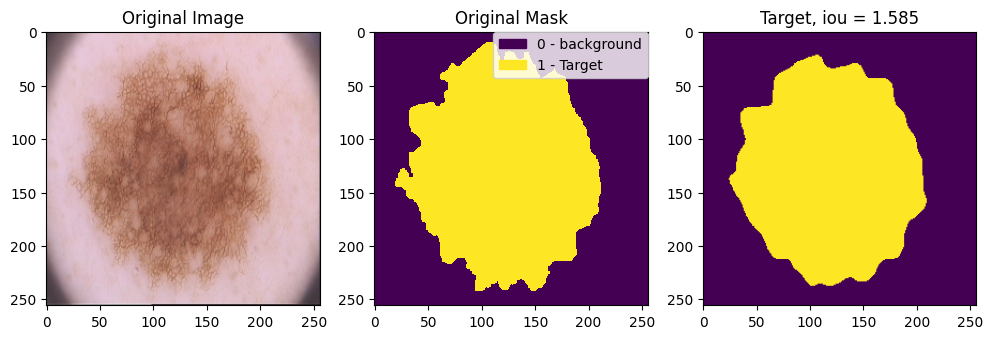

epoch: 28


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1126, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8087342828512192
   val_loss: tensor(0.2375, device='cuda:0')
   val_iou: 1.5959387719631195


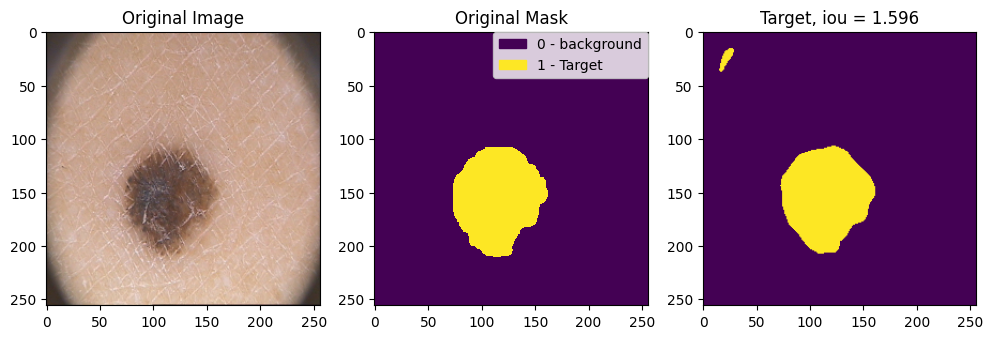

epoch: 29


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1031, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8259505778551102
   val_loss: tensor(0.2127, device='cuda:0')
   val_iou: 1.6358844935894012


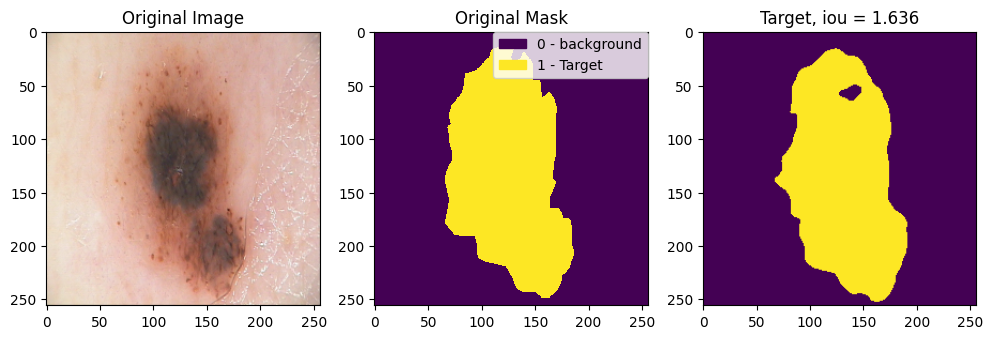

epoch: 30


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1036, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8232837468385696
   val_loss: tensor(0.2065, device='cuda:0')
   val_iou: 1.64302858710289


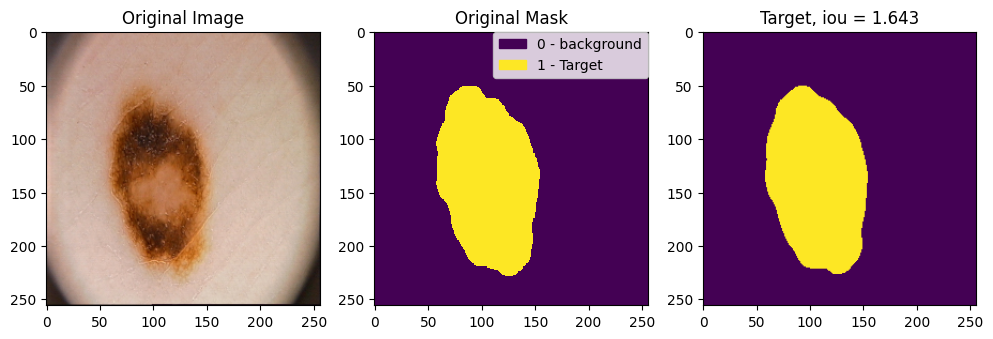

epoch: 31


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1069, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8184464275836945
   val_loss: tensor(0.3005, device='cuda:0')
   val_iou: 1.4921723306179047


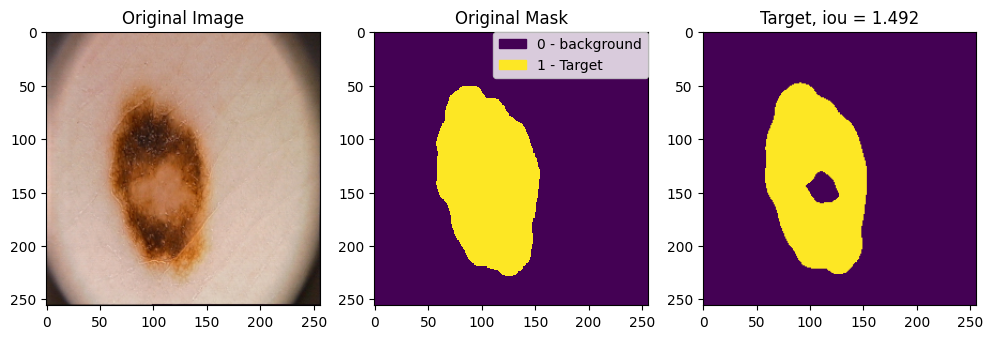

epoch: 32


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.0847, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8544179499149323
   val_loss: tensor(0.2329, device='cuda:0')
   val_iou: 1.5944286286830902


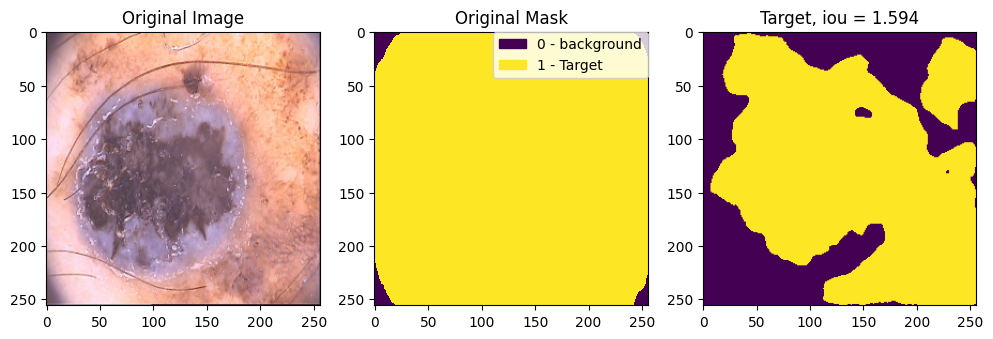

epoch: 33


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.0896, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8450532406568527
   val_loss: tensor(0.2102, device='cuda:0')
   val_iou: 1.6337879598140717


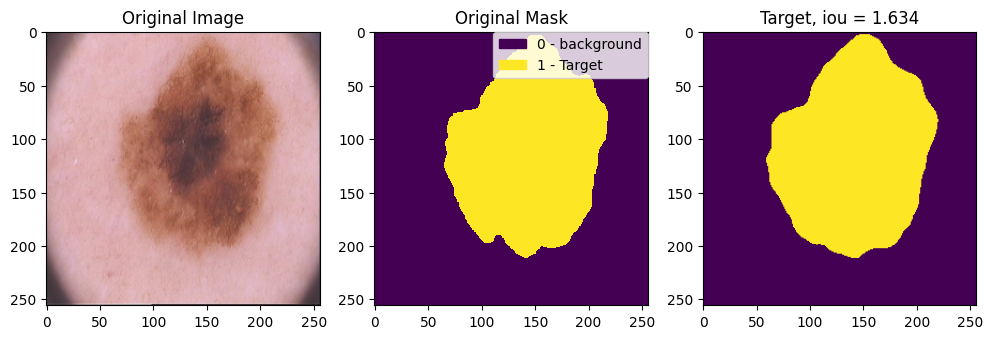

epoch: 34


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.0895, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.845603421330452
   val_loss: tensor(0.1968, device='cuda:0')
   val_iou: 1.6553309261798859


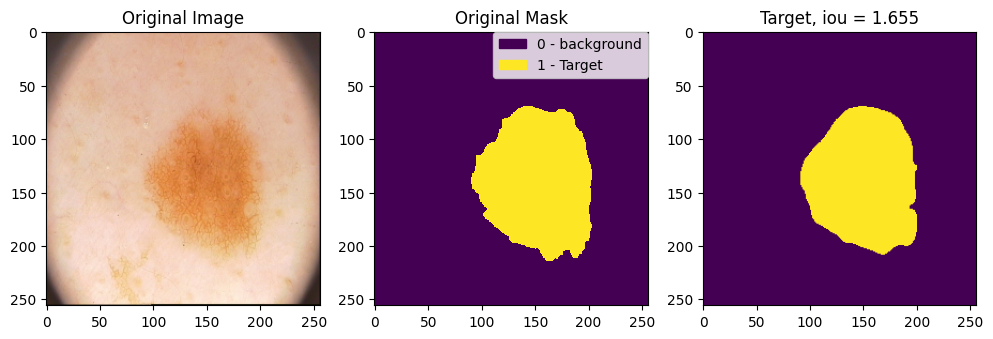

epoch: 35


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.1006, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8276176005601883
   val_loss: tensor(0.2429, device='cuda:0')
   val_iou: 1.5786609947681427


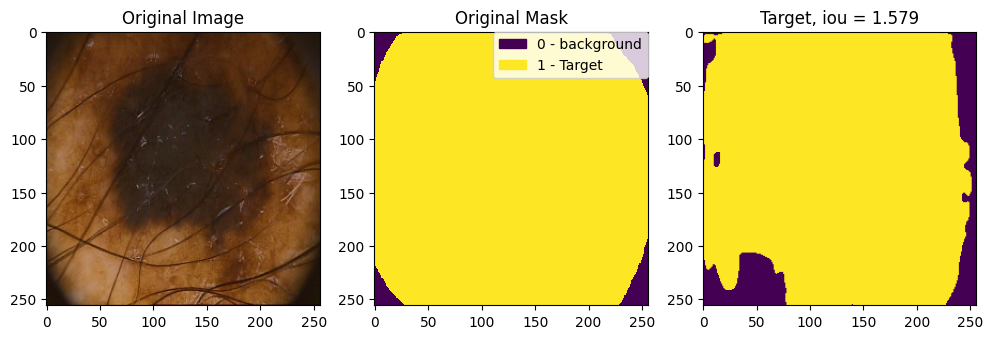

epoch: 36


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.0841, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8546389788389206
   val_loss: tensor(0.2174, device='cuda:0')
   val_iou: 1.6241122484207153


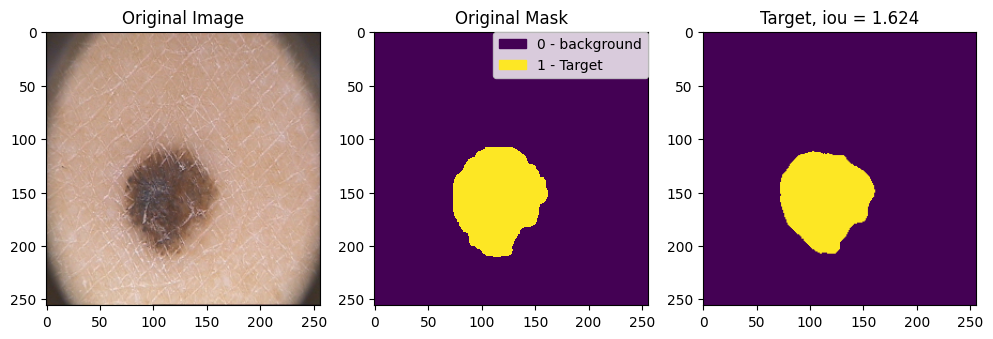

epoch: 37


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.0922, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8394094705581665
   val_loss: tensor(0.2252, device='cuda:0')
   val_iou: 1.6101529896259308


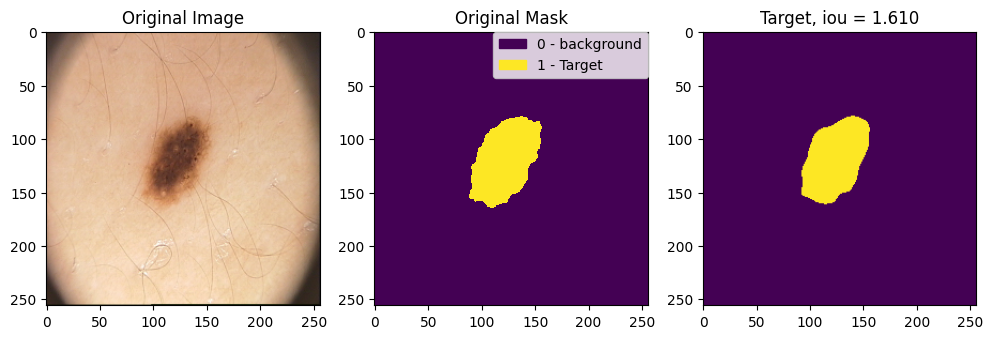

epoch: 38


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.0709, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8753770738840103
   val_loss: tensor(0.2345, device='cuda:0')
   val_iou: 1.5919184386730194


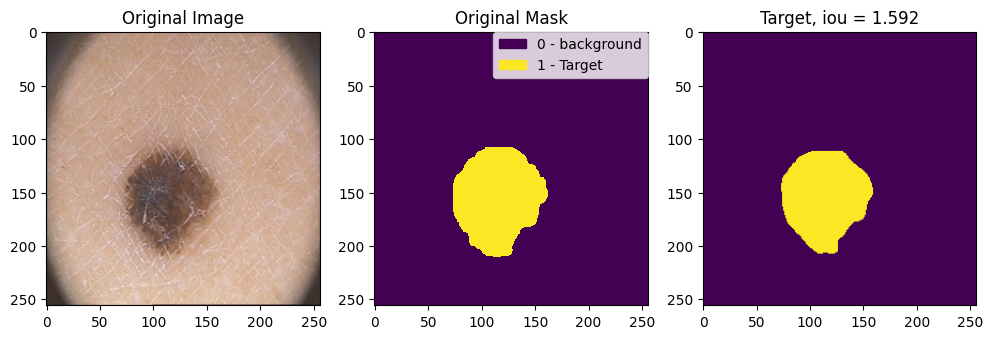

epoch: 39


0it [00:00, ?it/s]

0it [00:00, ?it/s]

   train_loss: tensor(0.0859, device='cuda:0', grad_fn=<AddBackward0>)
   train_iou: 0.8490488231182098
   val_loss: tensor(0.1912, device='cuda:0')
   val_iou: 1.663210928440094


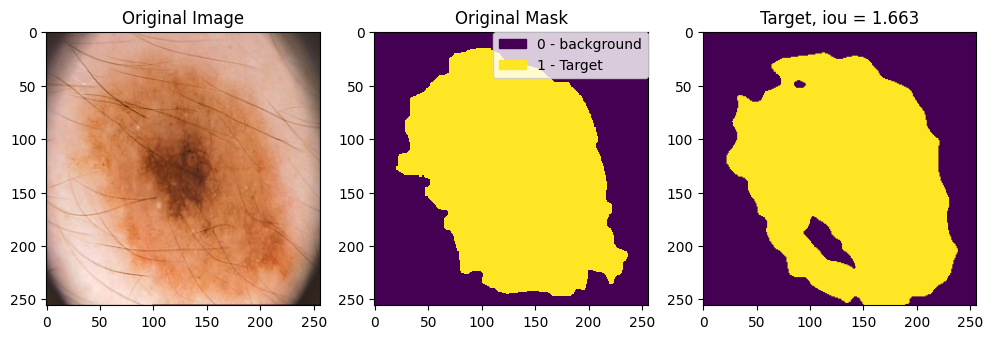

In [ ]:
loss = bce_loss
opt = torch.optim.Adam(segnet_model.parameters(), lr=1e-3)
model = train(model=segnet_model, opt=opt, loss_fn=dice_loss, epochs=40, data_train=train_dataloader, data_val=valid_dataloader, plot=True)

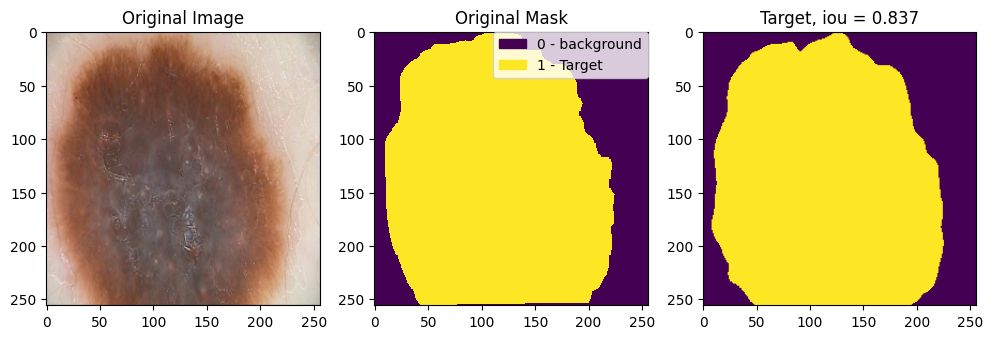

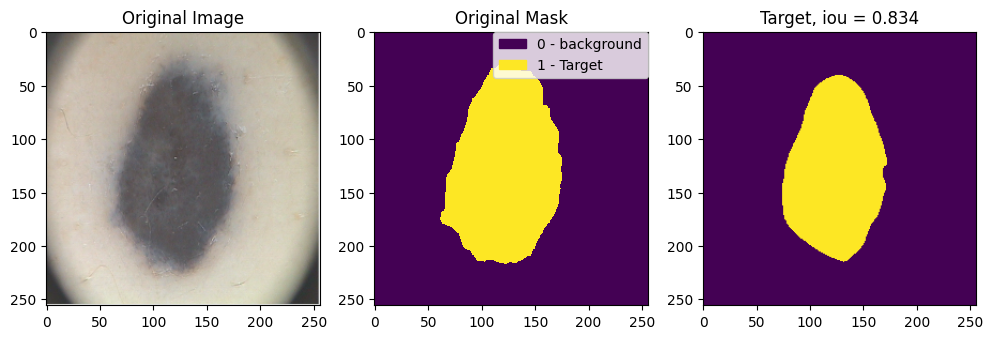

avg_iou: 0.8358332514762878


In [ ]:
test(model=model, test_data=test_dataloader)

# Новая модель!

## U-Net [2 балла]

[**U-Net**](https://arxiv.org/abs/1505.04597) — это архитектура нейронной сети, которая получает изображение и выводит его. Первоначально он был задуман для семантической сегментации (как мы ее будем использовать), но он настолько успешен, что с тех пор используется в других контекстах. Получая на вход медицинское изображение, он выведет изображение в оттенках серого, где интенсивность каждого пикселя зависит от вероятности того, что этот пиксель принадлежит интересующей нас области.

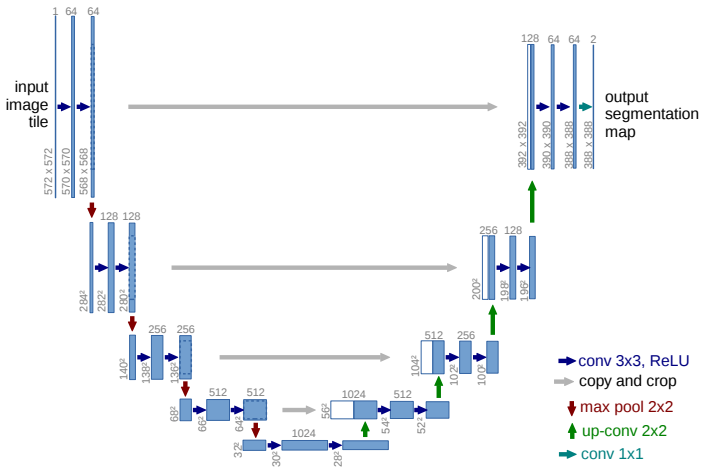

У нас в архитектуре все так же существует энкодер и декодер, как в **SegNet**, но отличительной особеностью данной модели являются *skip-conenctions*, соединяющие части декодера и энкодера. То есть для того чтобы передать на вход декодера тензор, мы конкатенируем симметричный выход с энкодера и выход предыдущего слоя декодера.

* Ronneberger, Olaf, Philipp Fischer, and Thomas Brox. "[U-Net: Convolutional networks for biomedical image segmentation.](https://arxiv.org/pdf/1505.04597.pdf)" International Conference on Medical image computing and computer-assisted intervention. Springer, Cham, 2015.

In [ ]:
import torch.nn.functional as F
import torch.nn as nn

In [ ]:
class UNet(nn.Module):
    def __init__(self, n_class=1):
        super().__init__()

        # TODO

    def forward(self, x):
        #  TODO

        return output

In [ ]:
unet_model = UNet().to(device)

## Обучите UNet

Задание: обучите UNet на всех трех лоссах: BCE, Dice, Focal и сравните результаты с SegNet:
*   Какая модель дает лучшие значения по метрике?
*   Какая модель дает лучшие значения по лоссам?
*   Какая модель обучается быстрее?
*   Сравните визуально результаты SegNet и UNet.

Напишите развернутый ответ на вопросы.

